Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
100%|██████████| 50/50 [00:04<00:00, 10.46it/s]


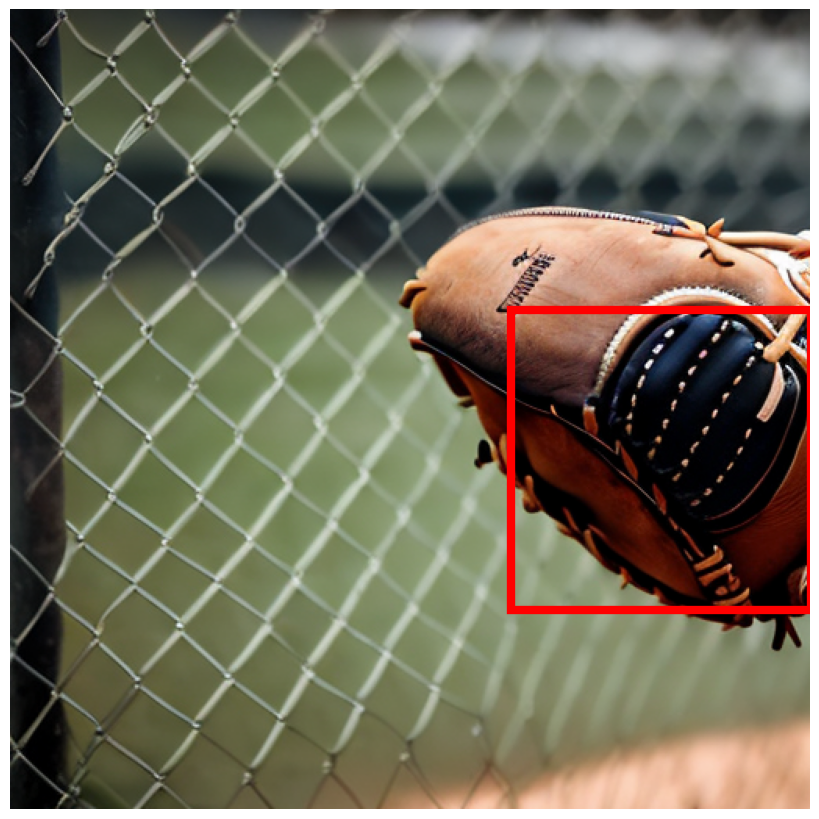

In [46]:
import os
os.chdir('/home/banyh2000/odfn')
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
from scripts.models.diffuserpipeline import StableDiffusionPipeline
import torch
import random
import numpy as np
from typing import TypeVar
T = TypeVar('T')
from PIL import Image
from pathlib import Path
import os
from tqdm import tqdm
from matplotlib import pyplot as plt
from scripts.utils.utils_odfn import variance_index_sorted, seeds_plus, seeds_plus_dict

def auto_device(obj: T = torch.device('cpu')) -> T:
    if isinstance(obj, torch.device):
        return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if torch.cuda.is_available():
        return obj.to('cuda')

def set_seed(seed: int) -> torch.Generator:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    gen = torch.Generator(device=auto_device())
    gen.manual_seed(seed)

    return gen

def replace(latent_source, latent_target, bounding_box_latent_source, bounding_box_latent_target):
    """_summary_

    Args:
        latent_source (_type_): _description_
        latent_target (_type_): _description_
        bounding_box_latent_source (_type_): _description_
        bounding_box_latent_target (_type_): _description_

    Returns:
        _type_: _description_
    """
    x_s, y_s, width_s, height_s = bounding_box_latent_source
    x_t, y_t, width_t, height_t = bounding_box_latent_target
    latent_target[:, :, y_t:y_t+height_t, x_t:x_t+width_t] = latent_source[:, :, y_s:y_s+height_s, x_s:x_s+width_s]
    return latent_target


# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[19040]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,10,24,30]


seed_source = seeds_plus[variance_index_sorted[0]]
seed_target = seeds_plus[variance_index_sorted[1000]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# prompt_source = "A grizzly bear fishes in a rushing river."
# prompt_target = "A grizzly bear fishes in a rushing river."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,0,24,30]

# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[1000]]

prompt_source = "The baseball glove waits by the fence."
prompt_target = "The baseball glove waits by the fence."

# prompt_target = 'A woman carries a stylish handbag on her shoulder.'
# prompt_source = 'A woman carries a stylish handbag on her shoulder.'

bounding_box_latent_source = [40,24,24,24]
bounding_box_latent_target = [10,34,34,30]

model_id = 'stabilityai/stable-diffusion-2-base'
device = 'cuda'
pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True).to(device)

latents_source = torch.randn((1,4,64,64), generator=set_seed(seed_source), device='cuda', dtype=torch.float32)
latents_target = torch.randn((1,4,64,64), generator=set_seed(seed_target), device='cuda', dtype=torch.float32)

with torch.no_grad():
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    bounding_box_image_source = [value * 8 for value in bounding_box_latent_source]
    bounding_box_image_target = [value * 8 for value in bounding_box_latent_target]
    
    out_source, latents_source_final = pipe(prompt=prompt_source, generator=set_seed(seed_source), latents = latents_source, output_type = "latent and pil")
    axs.imshow(out_source.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_source[0], bounding_box_image_source[1]), bounding_box_image_source[2], bounding_box_image_source[3], fill=None, edgecolor='red', lw=6))
    fig.savefig('/home/banyh2000/odfn/wrapup_data/baseball_glove_ori.png')
    
    

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
 18%|█▊        | 9/50 [00:00<00:03, 11.20it/s]

100%|██████████| 50/50 [00:04<00:00, 11.46it/s]


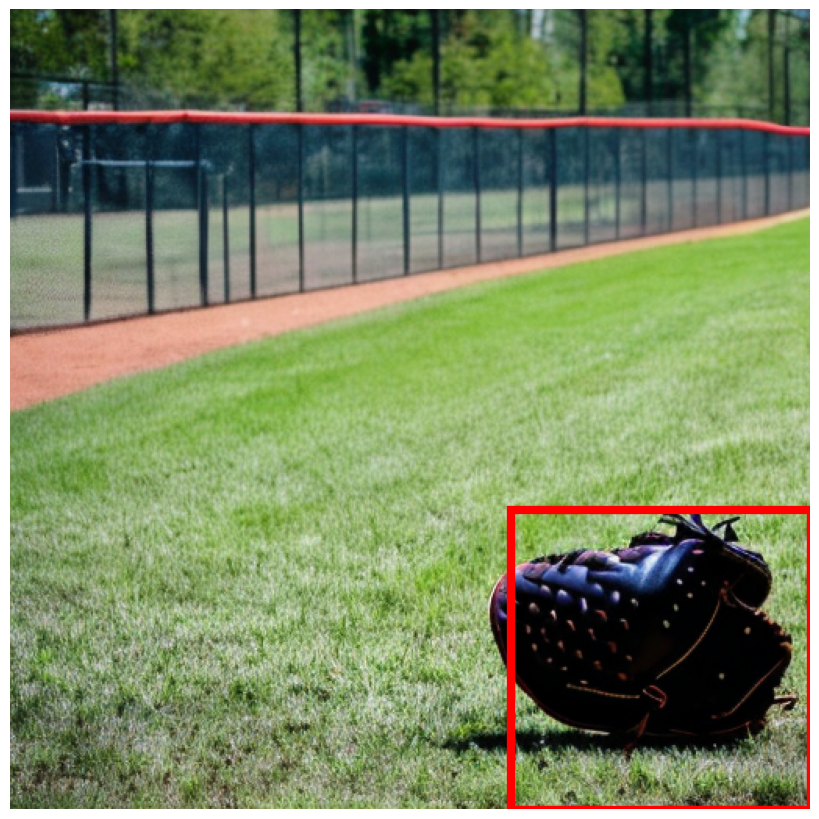

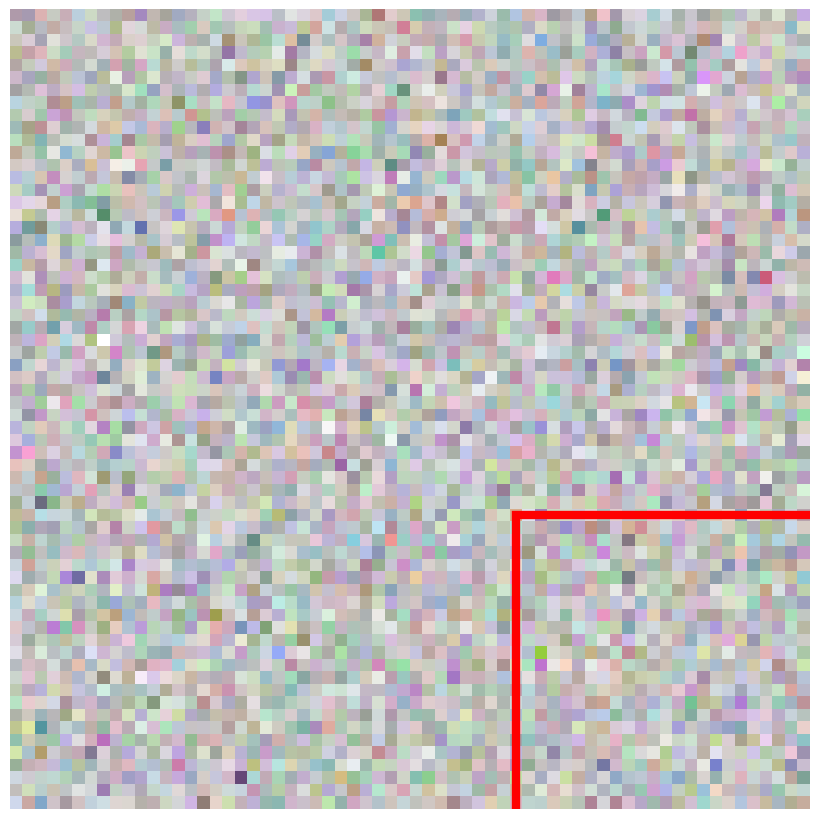

In [41]:
import os
os.chdir('/home/banyh2000/odfn')
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
from scripts.models.diffuserpipeline import StableDiffusionPipeline
import torch
import random
import numpy as np
from typing import TypeVar
T = TypeVar('T')
from PIL import Image
from pathlib import Path
import os
from tqdm import tqdm
from matplotlib import pyplot as plt
from scripts.utils.utils_odfn import variance_index_sorted, seeds_plus, seeds_plus_dict

def auto_device(obj: T = torch.device('cpu')) -> T:
    if isinstance(obj, torch.device):
        return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if torch.cuda.is_available():
        return obj.to('cuda')

def set_seed(seed: int) -> torch.Generator:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    gen = torch.Generator(device=auto_device())
    gen.manual_seed(seed)

    return gen

def replace(latent_source, latent_target, bounding_box_latent_source, bounding_box_latent_target):
    """_summary_

    Args:
        latent_source (_type_): _description_
        latent_target (_type_): _description_
        bounding_box_latent_source (_type_): _description_
        bounding_box_latent_target (_type_): _description_

    Returns:
        _type_: _description_
    """
    x_s, y_s, width_s, height_s = bounding_box_latent_source
    x_t, y_t, width_t, height_t = bounding_box_latent_target
    latent_target[:, :, y_t:y_t+height_t, x_t:x_t+width_t] = latent_source[:, :, y_s:y_s+height_s, x_s:x_s+width_s]
    return latent_target


# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[19040]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,10,24,30]


seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[18099]]
# seed_target = seeds_plus[variance_index_sorted[18573]] handbag
# seed_target = seeds_plus[variance_index_sorted[19993]] baseball_glove [10,40,24,24]
seed_target = seeds_plus[variance_index_sorted[17771]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# prompt_source = "A grizzly bear fishes in a rushing river."
# prompt_target = "A grizzly bear fishes in a rushing river."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,0,24,30]

# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[1000]]

prompt_source = "The baseball glove waits by the fence."
prompt_target = "The baseball glove waits by the fence."

# prompt_target = 'A woman carries a stylish handbag on her shoulder.'
# prompt_source = 'A woman carries a stylish handbag on her shoulder.'

bounding_box_latent_source = [40,24,24,24]
bounding_box_latent_target = [40,40,24,24]

model_id = 'stabilityai/stable-diffusion-2-base'
device = 'cuda'
pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True).to(device)

latents_source = torch.randn((1,4,64,64), generator=set_seed(seed_source), device='cuda', dtype=torch.float32)
latents_target = torch.randn((1,4,64,64), generator=set_seed(seed_target), device='cuda', dtype=torch.float32)
bounding_box_image_source = [value * 8 for value in bounding_box_latent_source]
bounding_box_image_target = [value * 8 for value in bounding_box_latent_target]
with torch.no_grad():
    # fig, axs = plt.subplots(figsize=(8, 8))
    # axs.axis('off')
    # fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    # out_source, latents_source_final = pipe(prompt=prompt_source, generator=set_seed(seed_source), latents = latents_source, output_type = "latent and pil")
    # axs.imshow(out_source.images[0])
    # axs.add_patch(plt.Rectangle((bounding_box_image_source[0], bounding_box_image_source[1]), bounding_box_image_source[2], bounding_box_image_source[3], fill=None, edgecolor='red', lw=2))
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/sports_ball_ori.png')
    
    latents_target = replace(latents_source, latents_target, bounding_box_latent_source, bounding_box_latent_target)
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    fig.savefig('/home/banyh2000/odfn/wrapup_data/bear_tar.png')
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    latents_target = torch.randn((1,4,64,64), dtype=torch.float32)
    # scale to 0-1 linearly
    latents_target = (latents_target - latents_target.min()) / (latents_target.max() - latents_target.min())
    latents_target = latents_target.squeeze(0).permute(1, 2, 0).cpu().numpy()
    
    axs.add_patch(plt.Rectangle((bounding_box_latent_target[0], bounding_box_latent_target[1]), bounding_box_latent_target[2], bounding_box_latent_target[3], fill=None, edgecolor='red', lw=6))
    axs.imshow(latents_target)
    fig.savefig('/home/banyh2000/odfn/wrapup_data/latent_bear_tar.png')
    

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  5.18it/s]


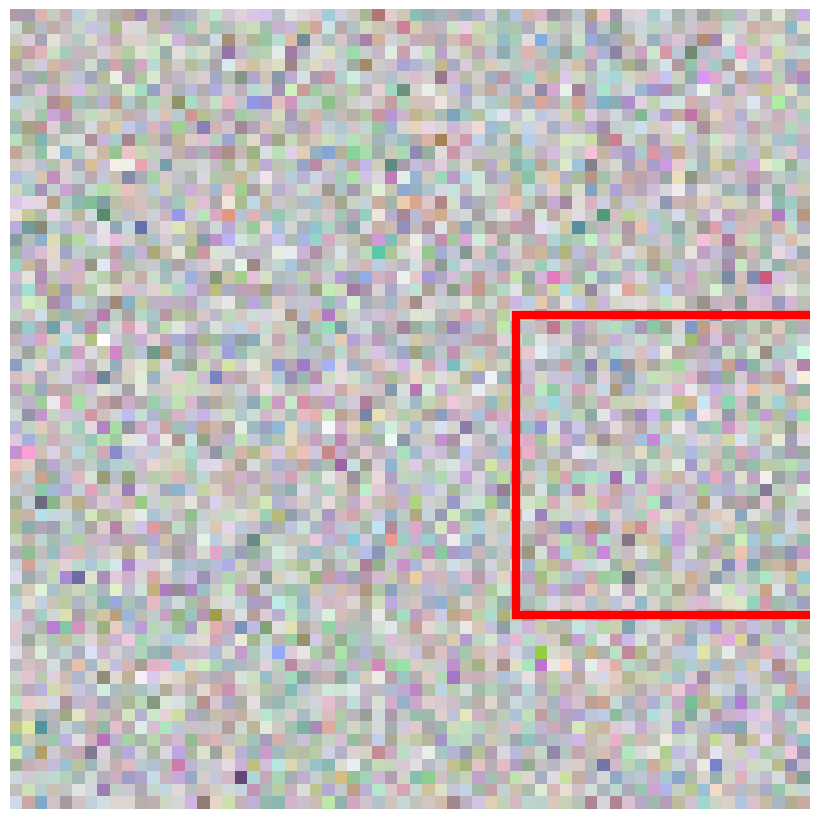

In [19]:
import os
os.chdir('/home/banyh2000/odfn')
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
from scripts.models.diffuserpipeline import StableDiffusionPipeline
import torch
import random
import numpy as np
from typing import TypeVar
T = TypeVar('T')
from PIL import Image
from pathlib import Path
import os
from tqdm import tqdm
from matplotlib import pyplot as plt
from scripts.utils.utils_odfn import variance_index_sorted, seeds_plus, seeds_plus_dict

def auto_device(obj: T = torch.device('cpu')) -> T:
    if isinstance(obj, torch.device):
        return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if torch.cuda.is_available():
        return obj.to('cuda')

def set_seed(seed: int) -> torch.Generator:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    gen = torch.Generator(device=auto_device())
    gen.manual_seed(seed)

    return gen

def replace(latent_source, latent_target, bounding_box_latent_source, bounding_box_latent_target):
    """_summary_

    Args:
        latent_source (_type_): _description_
        latent_target (_type_): _description_
        bounding_box_latent_source (_type_): _description_
        bounding_box_latent_target (_type_): _description_

    Returns:
        _type_: _description_
    """
    x_s, y_s, width_s, height_s = bounding_box_latent_source
    x_t, y_t, width_t, height_t = bounding_box_latent_target
    latent_target[:, :, y_t:y_t+height_t, x_t:x_t+width_t] = latent_source[:, :, y_s:y_s+height_s, x_s:x_s+width_s]
    return latent_target


# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[19040]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,10,24,30]


seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[18099]]
# seed_target = seeds_plus[variance_index_sorted[18573]] handbag
# seed_target = seeds_plus[variance_index_sorted[19993]] baseball_glove [10,40,24,24]
seed_target = seeds_plus[variance_index_sorted[17771]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# prompt_source = "A grizzly bear fishes in a rushing river."
# prompt_target = "A grizzly bear fishes in a rushing river."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,0,24,30]

# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[1000]]

prompt_source = "The baseball glove waits by the fence."
prompt_target = "The baseball glove waits by the fence."

# prompt_target = 'A woman carries a stylish handbag on her shoulder.'
# prompt_source = 'A woman carries a stylish handbag on her shoulder.'

bounding_box_latent_source = [40,24,24,24]
bounding_box_latent_target = [40,40,24,24]

model_id = 'stabilityai/stable-diffusion-2-base'
device = 'cuda'
pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True).to(device)

latents_source = torch.randn((1,4,64,64), generator=set_seed(seed_source), device='cuda', dtype=torch.float32)
latents_target = torch.randn((1,4,64,64), generator=set_seed(seed_target), device='cuda', dtype=torch.float32)
bounding_box_image_source = [value * 8 for value in bounding_box_latent_source]
bounding_box_image_target = [value * 8 for value in bounding_box_latent_target]
with torch.no_grad():
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    latents_target = torch.randn((1,4,64,64), dtype=torch.float32)
    # scale to 0-1 linearly
    latents_target = (latents_target - latents_target.min()) / (latents_target.max() - latents_target.min())
    latents_target = latents_target.squeeze(0).permute(1, 2, 0).cpu().numpy()
    axs.add_patch(plt.Rectangle((bounding_box_latent_source[0], bounding_box_latent_source[1]), bounding_box_latent_source[2], bounding_box_latent_source[3], fill=None, edgecolor='red', lw=6))
    axs.imshow(latents_target)
    fig.savefig('/home/banyh2000/odfn/wrapup_data/latent_1.png')
    

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...: 100%|██████████| 6/6 [00:01<00:00,  5.23it/s]


100%|██████████| 50/50 [00:04<00:00, 11.48it/s]


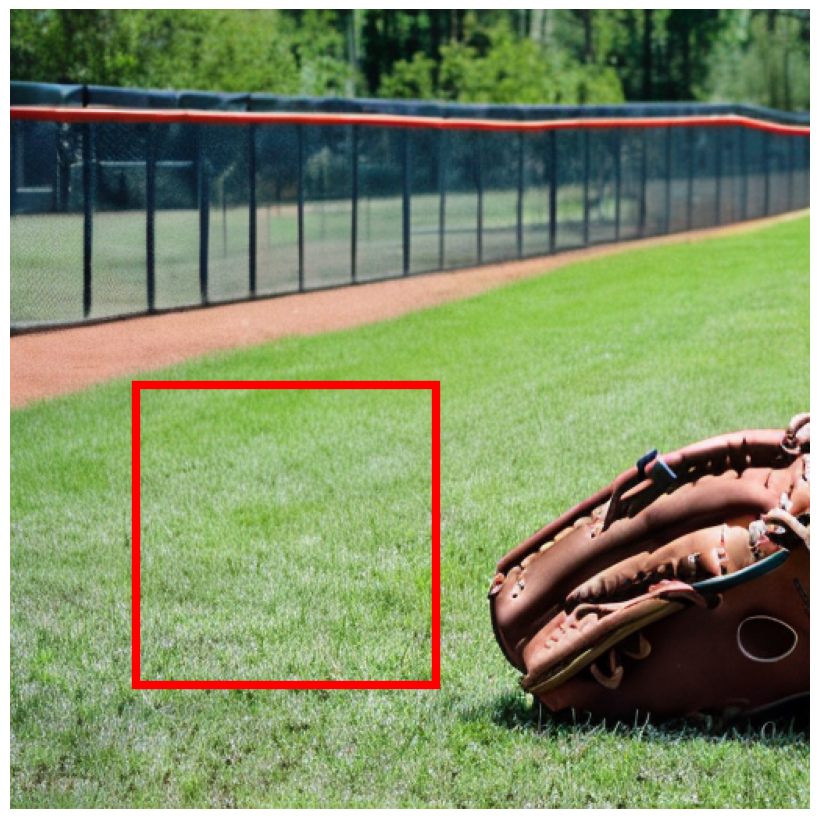

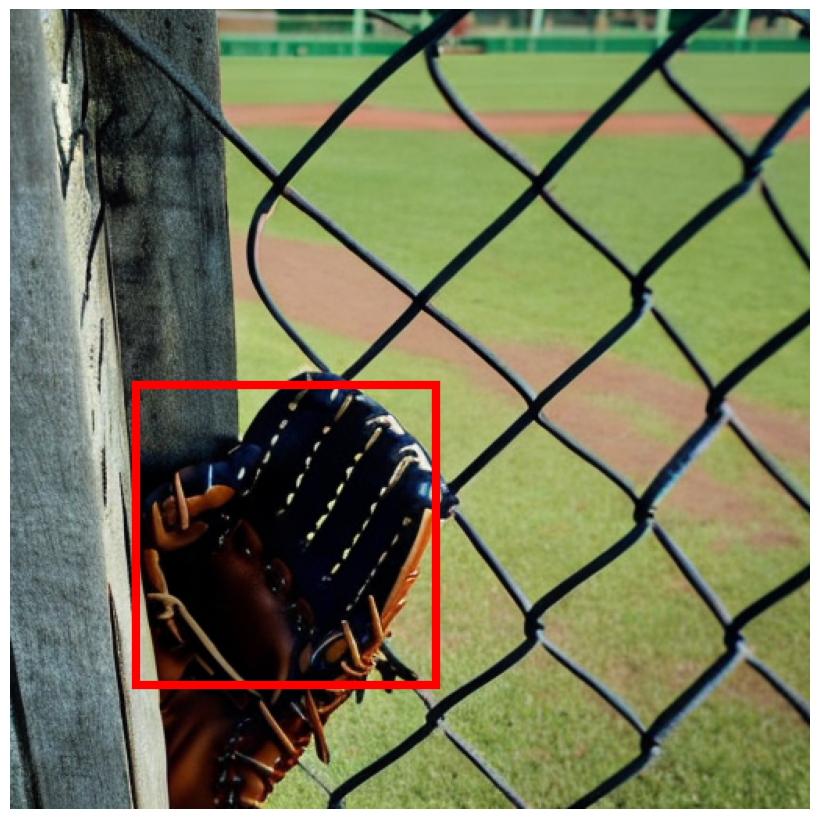

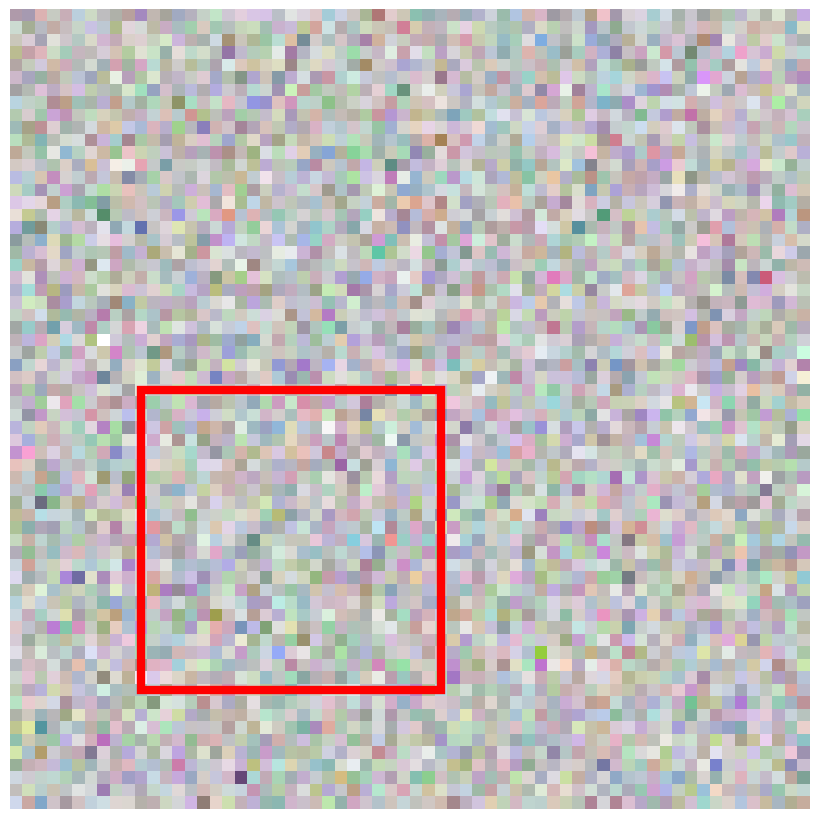

In [20]:
import os
os.chdir('/home/banyh2000/odfn')
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
from scripts.models.diffuserpipeline import StableDiffusionPipeline
import torch
import random
import numpy as np
from typing import TypeVar
T = TypeVar('T')
from PIL import Image
from pathlib import Path
import os
from tqdm import tqdm
from matplotlib import pyplot as plt
from scripts.utils.utils_odfn import variance_index_sorted, seeds_plus, seeds_plus_dict

def auto_device(obj: T = torch.device('cpu')) -> T:
    if isinstance(obj, torch.device):
        return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if torch.cuda.is_available():
        return obj.to('cuda')

def set_seed(seed: int) -> torch.Generator:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    gen = torch.Generator(device=auto_device())
    gen.manual_seed(seed)

    return gen

def replace(latent_source, latent_target, bounding_box_latent_source, bounding_box_latent_target):
    """_summary_

    Args:
        latent_source (_type_): _description_
        latent_target (_type_): _description_
        bounding_box_latent_source (_type_): _description_
        bounding_box_latent_target (_type_): _description_

    Returns:
        _type_: _description_
    """
    x_s, y_s, width_s, height_s = bounding_box_latent_source
    x_t, y_t, width_t, height_t = bounding_box_latent_target
    latent_target[:, :, y_t:y_t+height_t, x_t:x_t+width_t] = latent_source[:, :, y_s:y_s+height_s, x_s:x_s+width_s]
    return latent_target


# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[19040]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,10,24,30]


seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[18099]]
# seed_target = seeds_plus[variance_index_sorted[18573]] handbag
# seed_target = seeds_plus[variance_index_sorted[19993]] baseball_glove [10,40,24,24]
seed_target = seeds_plus[variance_index_sorted[17771]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# prompt_source = "A grizzly bear fishes in a rushing river."
# prompt_target = "A grizzly bear fishes in a rushing river."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,0,24,30]

# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[1000]]

prompt_source = "The baseball glove waits by the fence."
prompt_target = "The baseball glove waits by the fence."

# prompt_target = 'A woman carries a stylish handbag on her shoulder.'
# prompt_source = 'A woman carries a stylish handbag on her shoulder.'

bounding_box_latent_source = [40,24,24,24]
bounding_box_latent_target = [10,30,24,24]

model_id = 'stabilityai/stable-diffusion-2-base'
device = 'cuda'
pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True).to(device)

latents_source = torch.randn((1,4,64,64), generator=set_seed(seed_source), device='cuda', dtype=torch.float32)
latents_target = torch.randn((1,4,64,64), generator=set_seed(seed_target), device='cuda', dtype=torch.float32)
bounding_box_image_source = [value * 8 for value in bounding_box_latent_source]
bounding_box_image_target = [value * 8 for value in bounding_box_latent_target]
with torch.no_grad():
    # fig, axs = plt.subplots(figsize=(8, 8))
    # axs.axis('off')
    # fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/baseball_glove_tar.png')

    
    latents_target = replace(latents_source, latents_target, bounding_box_latent_source, bounding_box_latent_target)
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    fig.savefig('/home/banyh2000/odfn/wrapup_data/baseball_glove_tar.png')
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    latents_target = torch.randn((1,4,64,64), dtype=torch.float32)
    # scale to 0-1 linearly
    latents_target = (latents_target - latents_target.min()) / (latents_target.max() - latents_target.min())
    latents_target = latents_target.squeeze(0).permute(1, 2, 0).cpu().numpy()
    
    axs.add_patch(plt.Rectangle((bounding_box_latent_target[0], bounding_box_latent_target[1]), bounding_box_latent_target[2], bounding_box_latent_target[3], fill=None, edgecolor='red', lw=6))
    axs.imshow(latents_target)
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/latent_baseball_glove_tar.png')
    

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...:  50%|█████     | 3/6 [00:00<00:00, 13.57it/s]

100%|██████████| 50/50 [00:04<00:00, 11.42it/s]


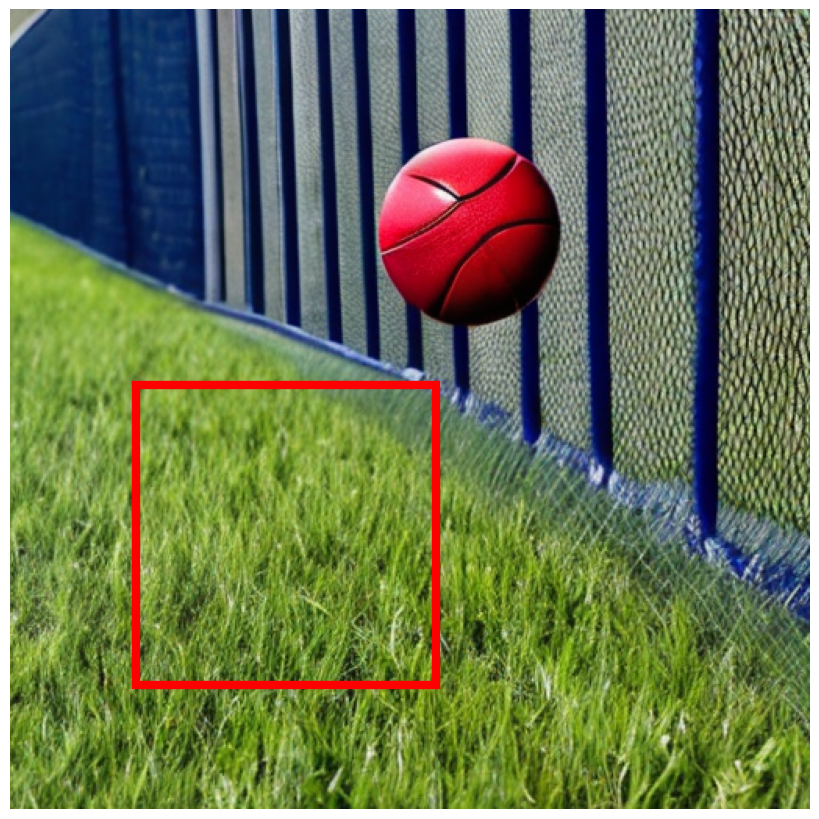

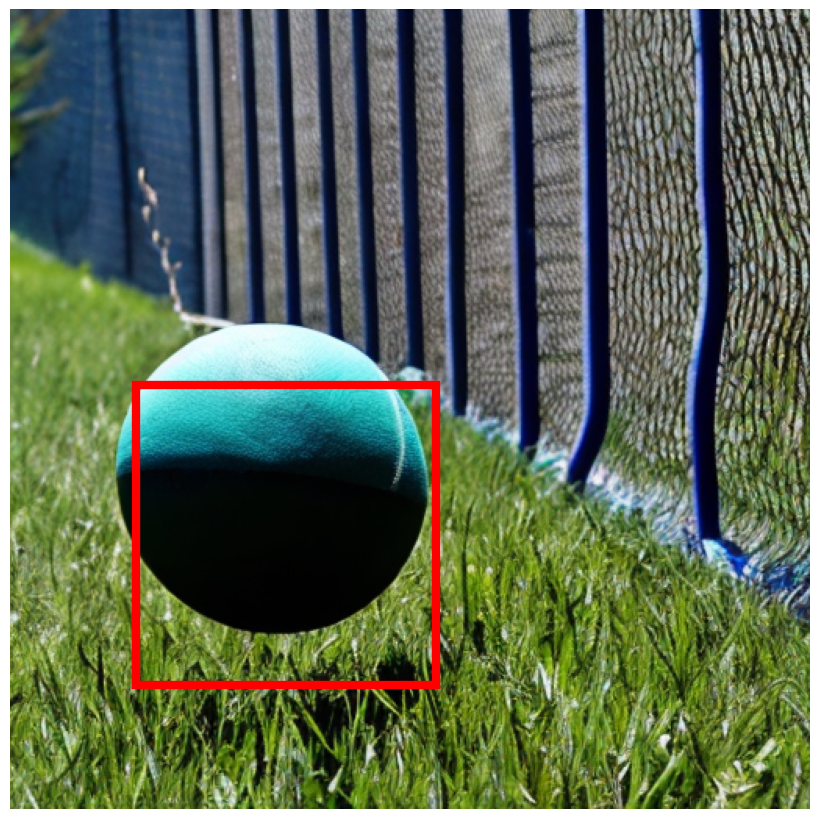

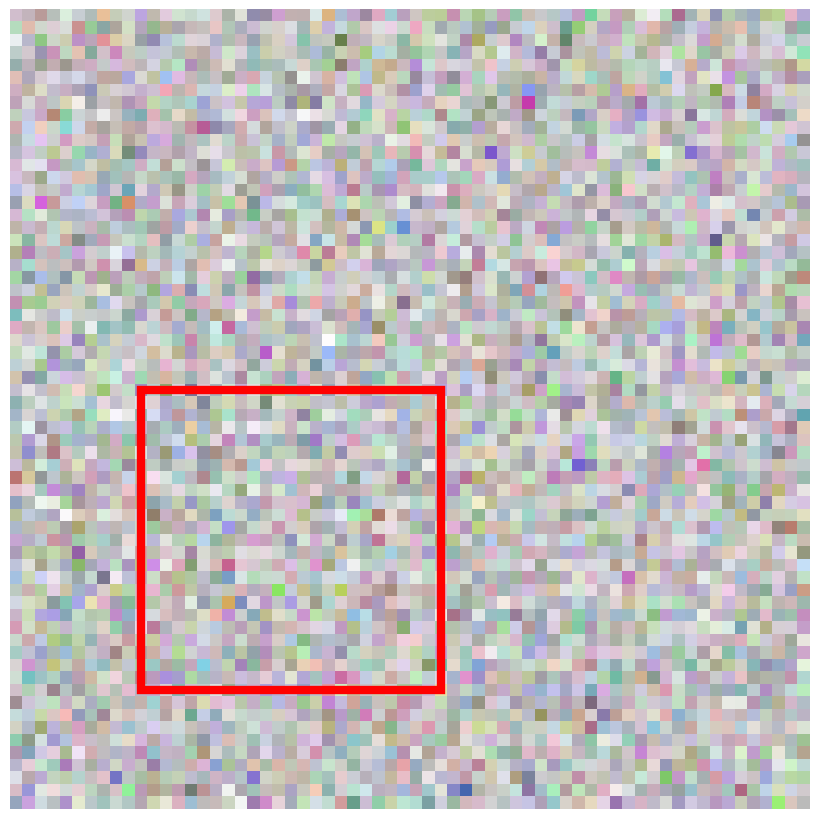

In [18]:
import os
os.chdir('/home/banyh2000/odfn')
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
from scripts.models.diffuserpipeline import StableDiffusionPipeline
import torch
import random
import numpy as np
from typing import TypeVar
T = TypeVar('T')
from PIL import Image
from pathlib import Path
import os
from tqdm import tqdm
from matplotlib import pyplot as plt
from scripts.utils.utils_odfn import variance_index_sorted, seeds_plus, seeds_plus_dict

def auto_device(obj: T = torch.device('cpu')) -> T:
    if isinstance(obj, torch.device):
        return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if torch.cuda.is_available():
        return obj.to('cuda')

def set_seed(seed: int) -> torch.Generator:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    gen = torch.Generator(device=auto_device())
    gen.manual_seed(seed)

    return gen

def replace(latent_source, latent_target, bounding_box_latent_source, bounding_box_latent_target):
    """_summary_

    Args:
        latent_source (_type_): _description_
        latent_target (_type_): _description_
        bounding_box_latent_source (_type_): _description_
        bounding_box_latent_target (_type_): _description_

    Returns:
        _type_: _description_
    """
    x_s, y_s, width_s, height_s = bounding_box_latent_source
    x_t, y_t, width_t, height_t = bounding_box_latent_target
    latent_target[:, :, y_t:y_t+height_t, x_t:x_t+width_t] = latent_source[:, :, y_s:y_s+height_s, x_s:x_s+width_s]
    return latent_target


# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[19040]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,10,24,30]


seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[18099]]
# seed_target = seeds_plus[variance_index_sorted[18573]] handbag
# seed_target = seeds_plus[variance_index_sorted[19993]] baseball_glove [10,40,24,24]
seed_target = seeds_plus[variance_index_sorted[17770]]

prompt_source = "A sports ball is caught in a fence."
prompt_target = "A sports ball is caught in a fence."

# prompt_source = "A grizzly bear fishes in a rushing river."
# prompt_target = "A grizzly bear fishes in a rushing river."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,0,24,30]

# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[1000]]

# prompt_source = "The baseball glove waits by the fence."
# prompt_target = "The baseball glove waits by the fence."

# prompt_target = 'A woman carries a stylish handbag on her shoulder.'
# prompt_source = 'A woman carries a stylish handbag on her shoulder.'

bounding_box_latent_source = [40,24,24,24]
bounding_box_latent_target = [10,30,24,24]

model_id = 'stabilityai/stable-diffusion-2-base'
device = 'cuda'
pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True).to(device)

latents_source = torch.randn((1,4,64,64), generator=set_seed(seed_source), device='cuda', dtype=torch.float32)
latents_target = torch.randn((1,4,64,64), generator=set_seed(seed_target), device='cuda', dtype=torch.float32)
bounding_box_image_source = [value * 8 for value in bounding_box_latent_source]
bounding_box_image_target = [value * 8 for value in bounding_box_latent_target]
with torch.no_grad():
    # fig, axs = plt.subplots(figsize=(8, 8))
    # axs.axis('off')
    # fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/baseball_glove_tar.png')

    
    latents_target = replace(latents_source, latents_target, bounding_box_latent_source, bounding_box_latent_target)
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    fig.savefig('/home/banyh2000/odfn/wrapup_data/sports_ball_tar.png')
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    latents_target = torch.randn((1,4,64,64), dtype=torch.float32)
    # scale to 0-1 linearly
    latents_target = (latents_target - latents_target.min()) / (latents_target.max() - latents_target.min())
    latents_target = latents_target.squeeze(0).permute(1, 2, 0).cpu().numpy()
    
    axs.add_patch(plt.Rectangle((bounding_box_latent_target[0], bounding_box_latent_target[1]), bounding_box_latent_target[2], bounding_box_latent_target[3], fill=None, edgecolor='red', lw=6))
    axs.imshow(latents_target)
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/latent_baseball_glove_tar.png')
    

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...:  50%|█████     | 3/6 [00:00<00:00, 12.68it/s]

100%|██████████| 50/50 [00:04<00:00, 11.37it/s]


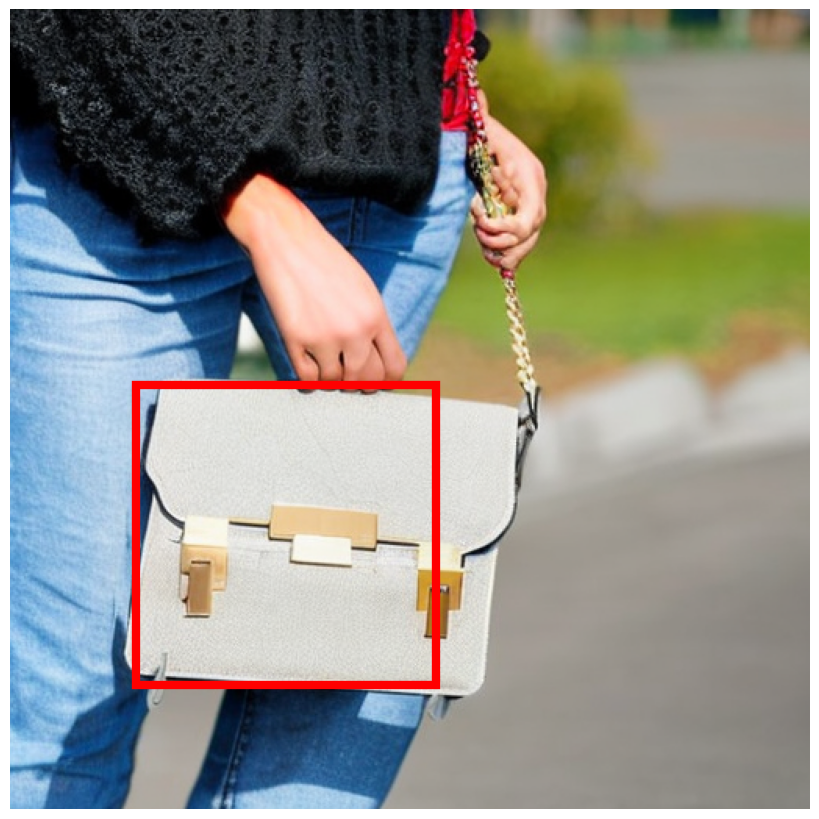

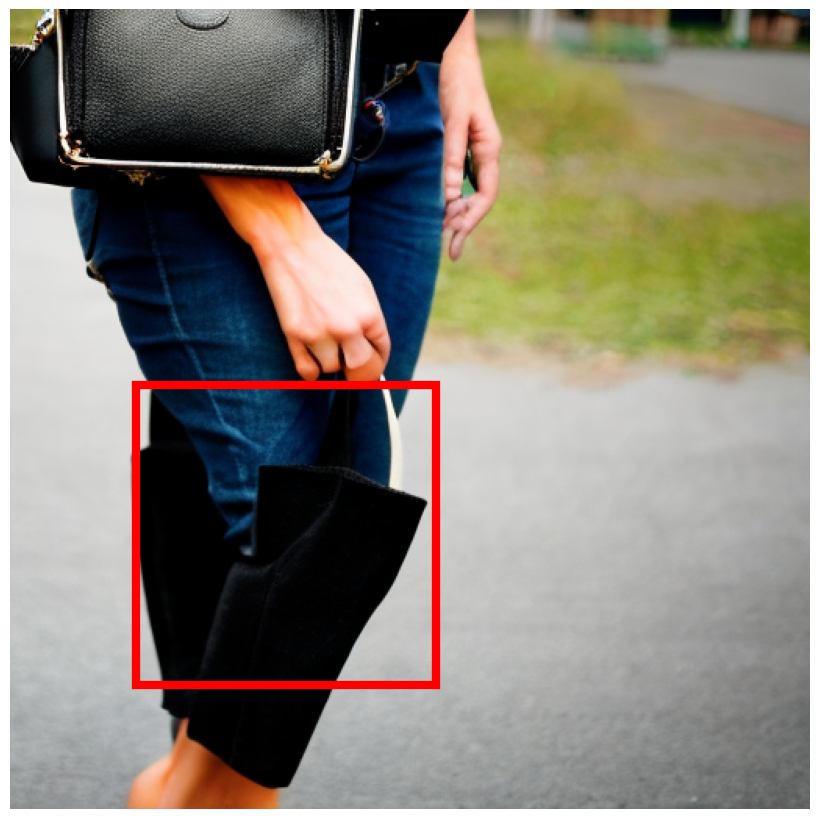

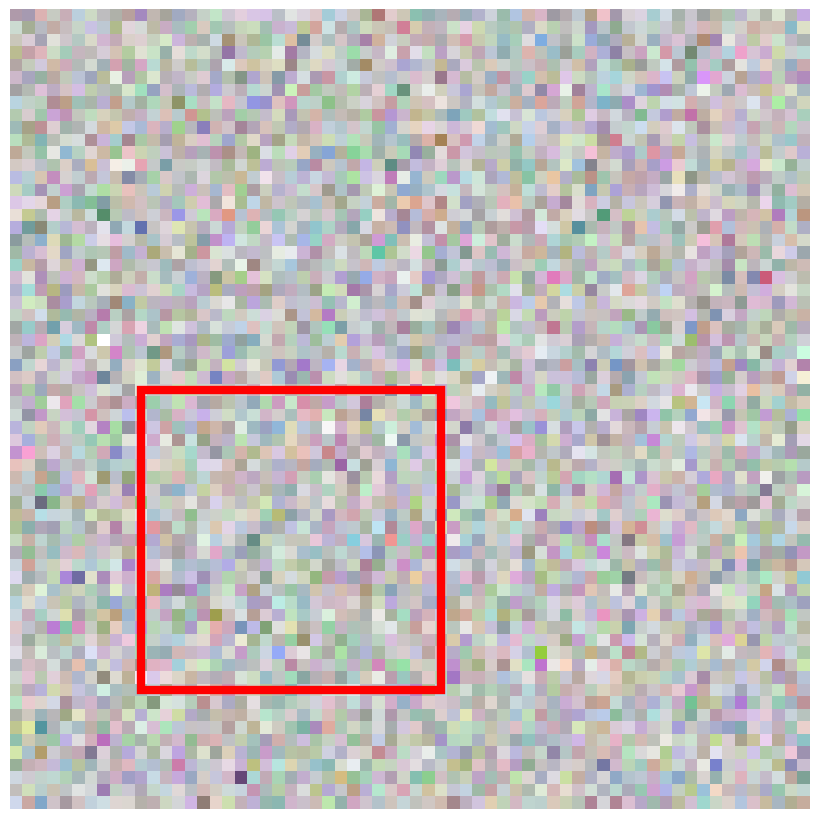

In [14]:
import os
os.chdir('/home/banyh2000/odfn')
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
from scripts.models.diffuserpipeline import StableDiffusionPipeline
import torch
import random
import numpy as np
from typing import TypeVar
T = TypeVar('T')
from PIL import Image
from pathlib import Path
import os
from tqdm import tqdm
from matplotlib import pyplot as plt
from scripts.utils.utils_odfn import variance_index_sorted, seeds_plus, seeds_plus_dict

def auto_device(obj: T = torch.device('cpu')) -> T:
    if isinstance(obj, torch.device):
        return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if torch.cuda.is_available():
        return obj.to('cuda')

def set_seed(seed: int) -> torch.Generator:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    gen = torch.Generator(device=auto_device())
    gen.manual_seed(seed)

    return gen

def replace(latent_source, latent_target, bounding_box_latent_source, bounding_box_latent_target):
    """_summary_

    Args:
        latent_source (_type_): _description_
        latent_target (_type_): _description_
        bounding_box_latent_source (_type_): _description_
        bounding_box_latent_target (_type_): _description_

    Returns:
        _type_: _description_
    """
    x_s, y_s, width_s, height_s = bounding_box_latent_source
    x_t, y_t, width_t, height_t = bounding_box_latent_target
    latent_target[:, :, y_t:y_t+height_t, x_t:x_t+width_t] = latent_source[:, :, y_s:y_s+height_s, x_s:x_s+width_s]
    return latent_target


# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[19040]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,10,24,30]


seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[18099]]
# seed_target = seeds_plus[variance_index_sorted[18573]] handbag
# seed_target = seeds_plus[variance_index_sorted[19993]] baseball_glove [10,40,24,24]
seed_target = seeds_plus[variance_index_sorted[17771]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# prompt_source = "A grizzly bear fishes in a rushing river."
# prompt_target = "A grizzly bear fishes in a rushing river."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,0,24,30]

# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[1000]]

# prompt_source = "The baseball glove waits by the fence."
# prompt_target = "The baseball glove waits by the fence."

prompt_target = 'A woman carries a stylish handbag on her shoulder.'
prompt_source = 'A woman carries a stylish handbag on her shoulder.'

bounding_box_latent_source = [40,24,24,24]
bounding_box_latent_target = [10,30,24,24]

model_id = 'stabilityai/stable-diffusion-2-base'
device = 'cuda'
pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True).to(device)

latents_source = torch.randn((1,4,64,64), generator=set_seed(seed_source), device='cuda', dtype=torch.float32)
latents_target = torch.randn((1,4,64,64), generator=set_seed(seed_target), device='cuda', dtype=torch.float32)
bounding_box_image_source = [value * 8 for value in bounding_box_latent_source]
bounding_box_image_target = [value * 8 for value in bounding_box_latent_target]
with torch.no_grad():
    # fig, axs = plt.subplots(figsize=(8, 8))
    # axs.axis('off')
    # fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    fig.savefig('/home/banyh2000/odfn/wrapup_data/handbag_tar.png')

    
    latents_target = replace(latents_source, latents_target, bounding_box_latent_source, bounding_box_latent_target)
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/baseball_glove_tar.png')
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    latents_target = torch.randn((1,4,64,64), dtype=torch.float32)
    # scale to 0-1 linearly
    latents_target = (latents_target - latents_target.min()) / (latents_target.max() - latents_target.min())
    latents_target = latents_target.squeeze(0).permute(1, 2, 0).cpu().numpy()
    
    axs.add_patch(plt.Rectangle((bounding_box_latent_target[0], bounding_box_latent_target[1]), bounding_box_latent_target[2], bounding_box_latent_target[3], fill=None, edgecolor='red', lw=6))
    axs.imshow(latents_target)
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/latent_baseball_glove_tar.png')
    

Keyword arguments {'use_auth_token': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...:  50%|█████     | 3/6 [00:00<00:00, 13.09it/s]

100%|██████████| 50/50 [00:04<00:00, 11.40it/s]


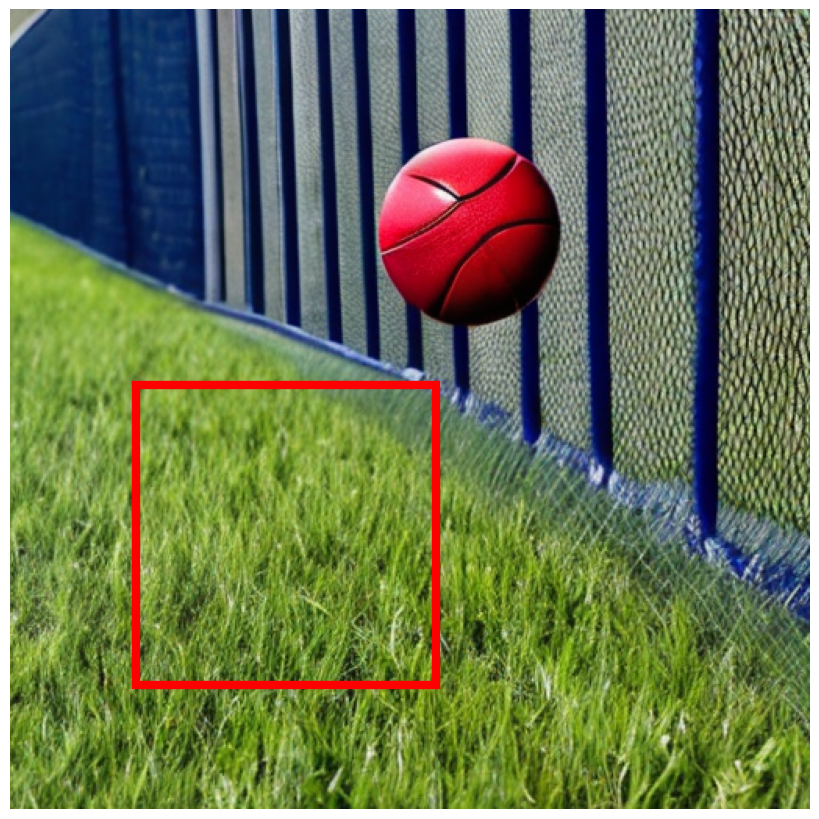

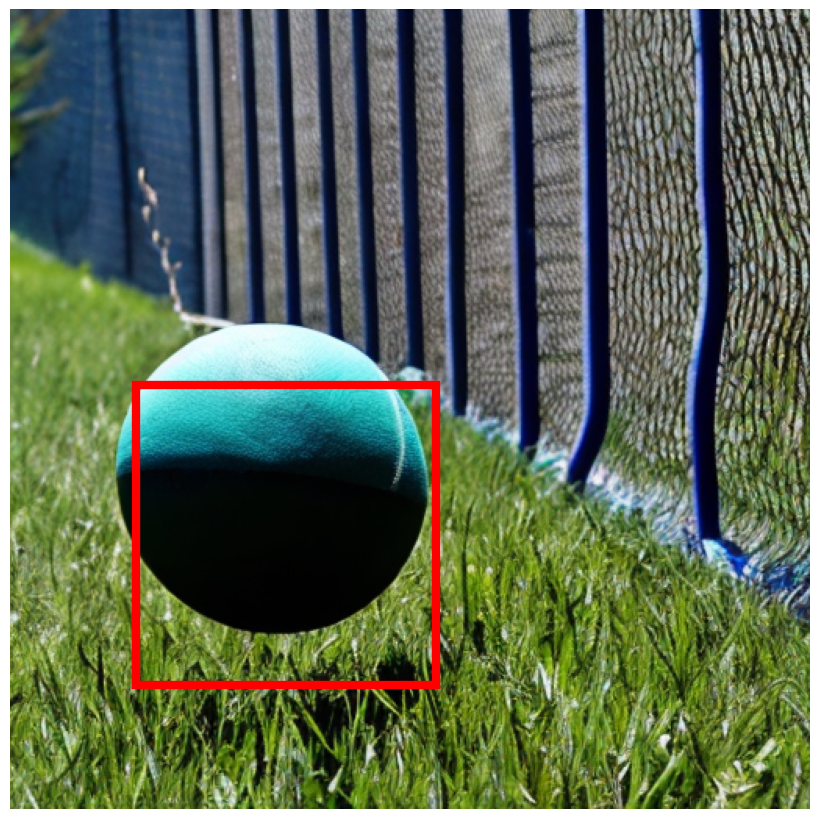

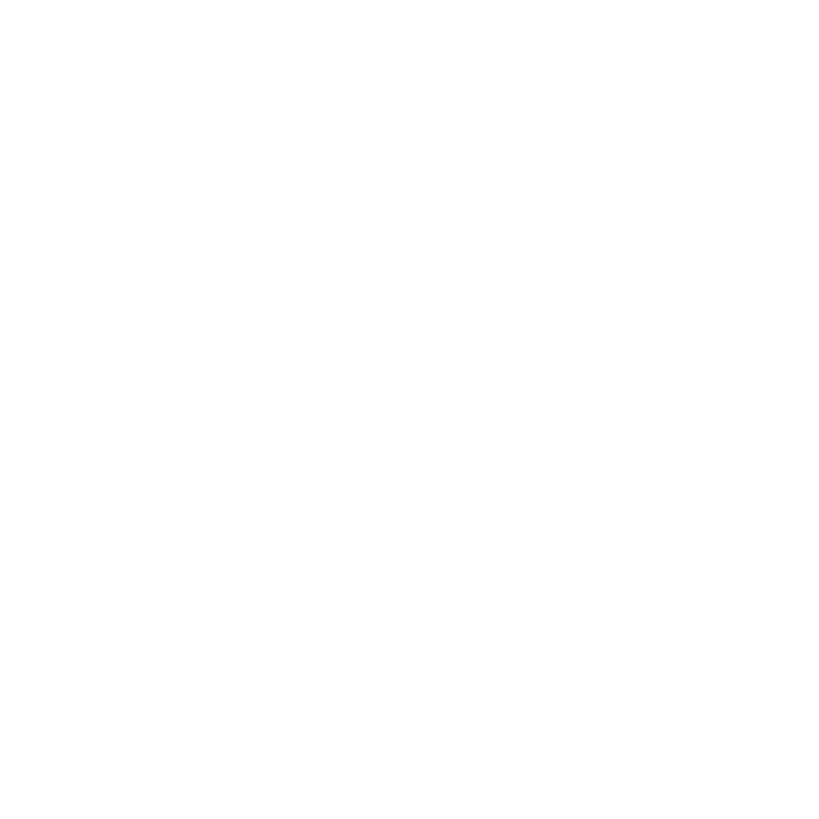

In [13]:
import os
os.chdir('/home/banyh2000/odfn')
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
from scripts.models.diffuserpipeline import StableDiffusionPipeline
import torch
import random
import numpy as np
from typing import TypeVar
T = TypeVar('T')
from PIL import Image
from pathlib import Path
import os
from tqdm import tqdm
from matplotlib import pyplot as plt
from scripts.utils.utils_odfn import variance_index_sorted, seeds_plus, seeds_plus_dict

def auto_device(obj: T = torch.device('cpu')) -> T:
    if isinstance(obj, torch.device):
        return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    if torch.cuda.is_available():
        return obj.to('cuda')

def set_seed(seed: int) -> torch.Generator:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    gen = torch.Generator(device=auto_device())
    gen.manual_seed(seed)

    return gen

def replace(latent_source, latent_target, bounding_box_latent_source, bounding_box_latent_target):
    """_summary_

    Args:
        latent_source (_type_): _description_
        latent_target (_type_): _description_
        bounding_box_latent_source (_type_): _description_
        bounding_box_latent_target (_type_): _description_

    Returns:
        _type_: _description_
    """
    x_s, y_s, width_s, height_s = bounding_box_latent_source
    x_t, y_t, width_t, height_t = bounding_box_latent_target
    latent_target[:, :, y_t:y_t+height_t, x_t:x_t+width_t] = latent_source[:, :, y_s:y_s+height_s, x_s:x_s+width_s]
    return latent_target


# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[19040]]

# prompt_source = "A sports ball is caught in a fence."
# prompt_target = "A sports ball is caught in a fence."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,10,24,30]


seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[18099]]
# seed_target = seeds_plus[variance_index_sorted[18573]] handbag
# seed_target = seeds_plus[variance_index_sorted[19993]] baseball_glove [10,40,24,24]
seed_target = seeds_plus[variance_index_sorted[17770]]

prompt_source = "A sports ball is caught in a fence."
prompt_target = "A sports ball is caught in a fence."

# prompt_source = "A grizzly bear fishes in a rushing river."
# prompt_target = "A grizzly bear fishes in a rushing river."

# bounding_box_latent_source = [40,20,24,30]
# bounding_box_latent_target = [20,0,24,30]

# seed_source = seeds_plus[variance_index_sorted[0]]
# seed_target = seeds_plus[variance_index_sorted[1000]]

# prompt_source = "The baseball glove waits by the fence."
# prompt_target = "The baseball glove waits by the fence."

# prompt_target = 'A woman carries a stylish handbag on her shoulder.'
# prompt_source = 'A woman carries a stylish handbag on her shoulder.'

bounding_box_latent_source = [40,24,24,24]
bounding_box_latent_target = [10,30,24,24]

model_id = 'stabilityai/stable-diffusion-2-base'
device = 'cuda'
pipe = StableDiffusionPipeline.from_pretrained(model_id, use_auth_token=True).to(device)

latents_source = torch.randn((1,4,64,64), generator=set_seed(seed_source), device='cuda', dtype=torch.float32)
latents_target = torch.randn((1,4,64,64), generator=set_seed(seed_target), device='cuda', dtype=torch.float32)
bounding_box_image_source = [value * 8 for value in bounding_box_latent_source]
bounding_box_image_target = [value * 8 for value in bounding_box_latent_target]
with torch.no_grad():
    # fig, axs = plt.subplots(figsize=(8, 8))
    # axs.axis('off')
    # fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/baseball_glove_tar.png')

    
    latents_target = replace(latents_source, latents_target, bounding_box_latent_source, bounding_box_latent_target)
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    
    out_target, latents_target_final = pipe(prompt=prompt_target, generator=set_seed(seed_target), latents = latents_target, output_type = "latent and pil")
    axs.imshow(out_target.images[0])
    axs.add_patch(plt.Rectangle((bounding_box_image_target[0], bounding_box_image_target[1]), bounding_box_image_target[2], bounding_box_image_target[3], fill=None, edgecolor='red', lw=6))
    fig.savefig('/home/banyh2000/odfn/wrapup_data/sports_ball_tar.png')
    
    fig, axs = plt.subplots(figsize=(8, 8))
    axs.axis('off')
    fig.subplots_adjust(left=0, right=1, top=1, bottom=0)
    latents_target = torch.randn((1,4,64,64), dtype=torch.float32)
    # scale to 0-1 linearly
    latents_target = (latents_target - latents_target.min()) / (latents_target.max() - latents_target.min())
    latents_target = latents_target.squeeze(0).permute(1, 2, 0).cpu().numpy()
    
    # axs.add_patch(plt.Rectangle((bounding_box_latent_target[0], bounding_box_latent_target[1]), bounding_box_latent_target[2], bounding_box_latent_target[3], fill=None, edgecolor='red', lw=6))
    # axs.imshow(latents_target)
    # fig.savefig('/home/banyh2000/odfn/wrapup_data/latent_baseball_glove_tar.png')
    